<a href="https://colab.research.google.com/github/8Kushal/Computer-Vision-Assignment-1/blob/main/249322B_Assignment1_Computer_VIsion_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

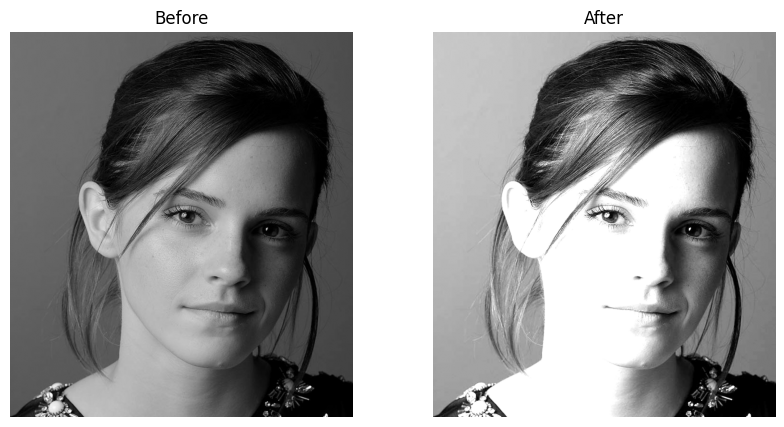

In [ ]:
import cv2  ##import openCV
import numpy as np
import matplotlib.pyplot as plt

# Load or create image
image = cv2.imread('/content/emma.jpg', cv2.IMREAD_GRAYSCALE)  ##IMREAD_GRAYSCALE means it open the image in black and white scale(one channle instead of three channels)
if image is None:
    image = np.zeros((256, 256), dtype=np.uint8)  ## Creates a 256x256 black image , data type,  np.uint8-"unsigned 8-bit integer"
    for i in range(256):
        image[:, i] = i


# Option 1: Increase contrast
#image.astype(float) --convert the image to
#Multiply every pixel value by 1.8
#Ensure values between 0-255
#convert back to 8 digit integer format
result = np.clip(1.8 * image.astype(float), 0, 255).astype(np.uint8)

# Option 2: Create negative
# result = 255 - image

# Option 3: Apply threshold (black and white)
# _, result = cv2.threshold(image, 100, 255, cv2.THRESH_BINARY)

# Display before and after
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(result, cmap='gray')
plt.title('After')
plt.axis('off')

plt.show()

Negative Transformation

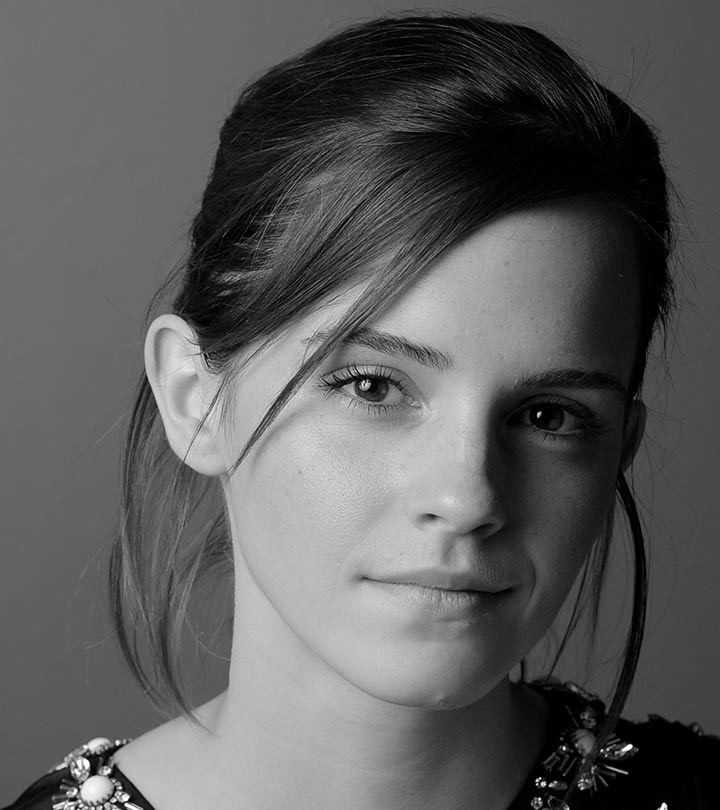

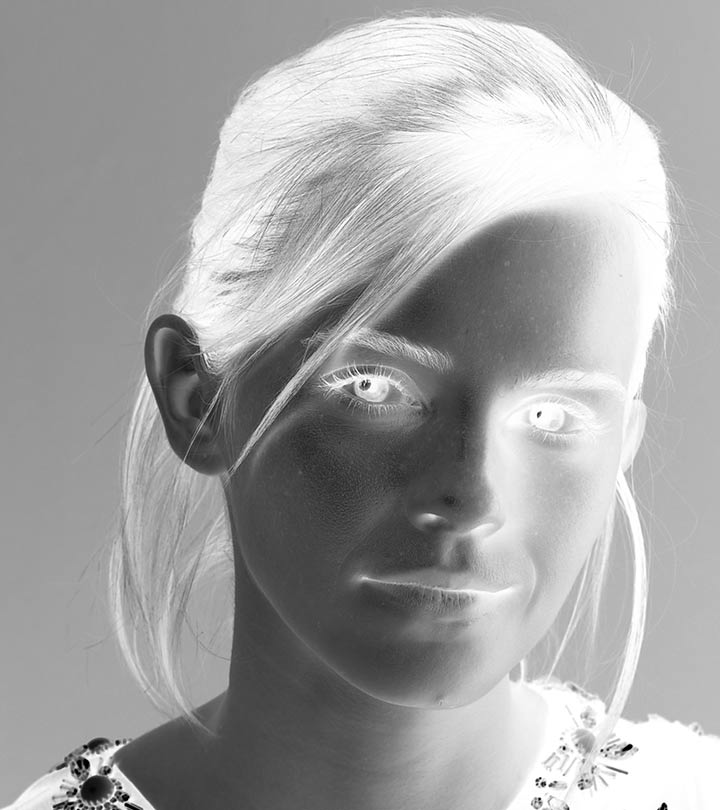

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load image
image = cv2.imread('/content/emma.jpg', cv2.IMREAD_GRAYSCALE)

# Apply negative transformation (simplest example)
if image is not None:
    negative_image = 255 - image

    # Save and show results
    cv2_imshow(image)
    cv2_imshow(negative_image)
    # cv2.waitKey(0) # waitKey is not needed with cv2_imshow
    # cv2.destroyAllWindows() # destroyAllWindows is not needed with cv2_imshow

    # Save the result
    cv2.imwrite('negative_result.jpg', negative_image)
else:
    print("Image not found!")

Question 2


/tmp/ipython-input-3034158725.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


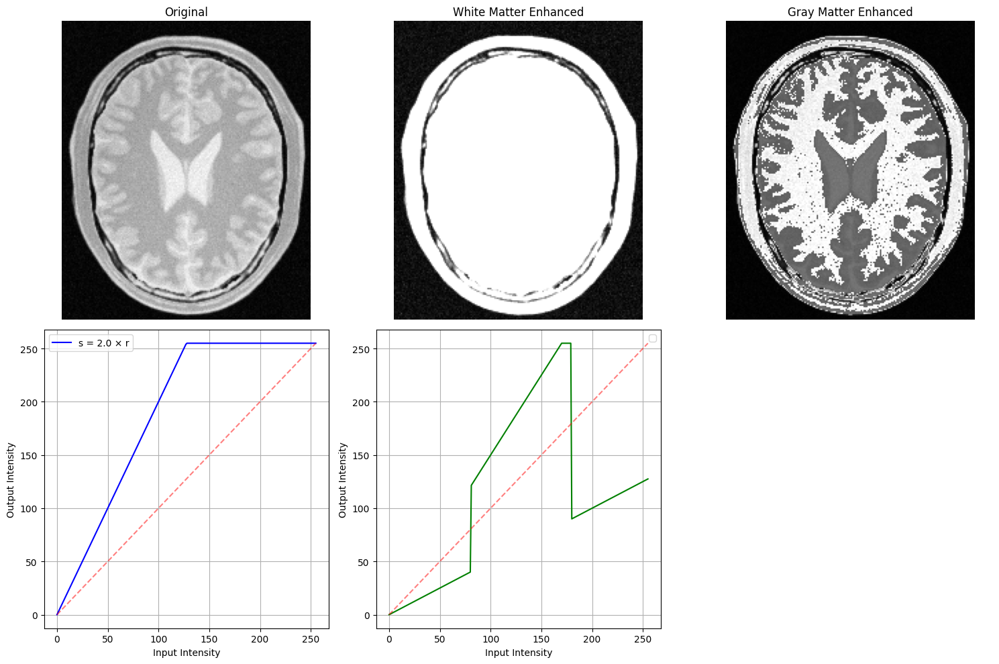

/tmp/ipython-input-3034158725.py:51: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  ax.hist(data.ravel(), 256, [0, 256])


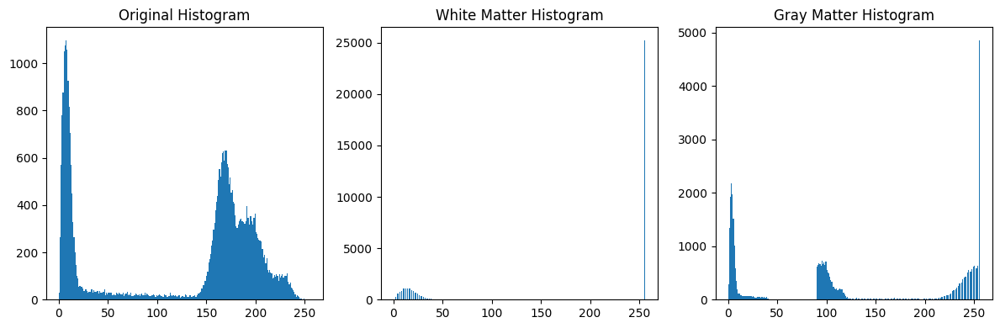

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load or create brain image
brain_image = cv2.imread('/content/brain_proton_density_slice.png', cv2.IMREAD_GRAYSCALE)
if brain_image is None:
    brain_image = np.zeros((200, 200), dtype=np.uint8)
    cv2.circle(brain_image, (100, 100), 80, 200, -1)
    cv2.circle(brain_image, (100, 100), 60, 120, -1)
    cv2.circle(brain_image, (100, 100), 100, 50, -1)

# Transformations
white_matter = np.clip(2.0 * brain_image.astype(float), 0, 255).astype(np.uint8)

gray_mask = np.logical_and(brain_image > 80, brain_image < 180)
gray_matter = brain_image.copy()
gray_matter[~gray_mask] //= 2
gray_matter[gray_mask] = np.clip(gray_matter[gray_mask] * 1.5, 0, 255)

# Display results
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
titles = ['Original', 'White Matter Enhanced', 'Gray Matter Enhanced',
          'White Matter Curve', 'Gray Matter Curve', '']

for i, (ax, title) in enumerate(zip(axes.flat[:3], titles[:3])):
    ax.imshow([brain_image, white_matter, gray_matter][i], cmap='gray')
    ax.set_title(title)
    ax.axis('off')

# Transformation curves
r = np.linspace(0, 255, 256)
axes[1, 0].plot(r, np.clip(2.0 * r, 0, 255), 'b-', label='s = 2.0 × r')
axes[1, 1].plot(r, [min(v*1.5,255) if 80<v<180 else v*0.5 for v in r], 'g-')

for ax in axes[1, :2]:
    ax.plot([0,255], [0,255], 'r--', alpha=0.5)
    ax.set_xlabel('Input Intensity')
    ax.set_ylabel('Output Intensity')
    ax.grid(True)
    ax.legend()

axes[1, 2].axis('off')
plt.tight_layout()
plt.show()

# Histograms
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for ax, data, title in zip(axes, [brain_image, white_matter, gray_matter],
                          ['Original', 'White Matter', 'Gray Matter']):
    ax.hist(data.ravel(), 256, [0, 256])
    ax.set_title(f'{title} Histogram')
plt.tight_layout()
plt.show()

Question 3

/tmp/ipython-input-1515484820.py:80: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(L.ravel(), 256, [0, 256], color='blue', alpha=0.7, label='Original L')
/tmp/ipython-input-1515484820.py:81: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(L_corrected.ravel(), 256, [0, 256], color='red', alpha=0.7, label='Corrected L')


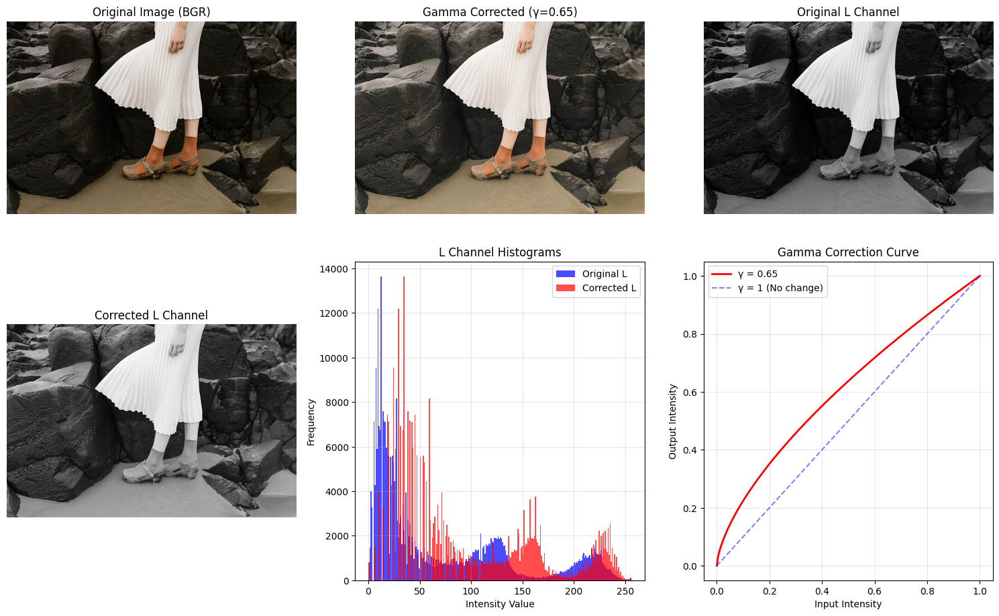

Applied gamma correction with γ = 0.65
γ < 1: Brightens the image (expands dark tones)
γ > 1: Darkens the image (compresses dark tones)


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the color image
image = cv2.imread('/content/highlights_and_shadows.jpg')  # Replace with your image path

if image is None:
    # Create a demo color image if no image is found
    image = np.zeros((200, 200, 3), dtype=np.uint8)
    cv2.circle(image, (100, 100), 80, (200, 150, 100), -1)  # Main object
    cv2.circle(image, (50, 50), 30, (100, 200, 150), -1)    # Secondary object
    cv2.circle(image, (150, 150), 40, (150, 100, 200), -1)  # Another object

# Convert BGR to L*a*b* color space
lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

# Split into L, a, b channels
L, a, b = cv2.split(lab_image)

# (a) Apply gamma correction to L channel
gamma_value = 0.65  # You can change this value (γ < 1 brightens, γ > 1 darkens)

# Normalize L channel to [0, 1] range, apply gamma, scale back to [0, 255]
# Convert L channel from 8-bit integers (0-255) to floating point numbers (0.0-1.0)
# This is necessary because mathematical operations work better with floats
L_normalized = L.astype(np.float32) / 255.0
# Before: [0, 1, 2, ..., 253, 254, 255] (integers)
# After:  [0.0, 0.0039, 0.0078, ..., 0.992, 0.996, 1.0] (floats)

# Apply the gamma correction formula: output = input^gamma
# This is the core mathematical operation for gamma correction
L_corrected = np.power(L_normalized, gamma_value)
# Example with gamma_value = 0.5:
# If input = 0.25 (dark), output = 0.25^0.5 = 0.5 (brighter) √
# If input = 0.01 (very dark), output = 0.01^0.5 = 0.1 (much brighter) √√
# If input = 0.81 (bright), output = 0.81^0.5 = 0.9 (slightly brighter)

# Convert back from normalized range (0.0-1.0) to 8-bit integer range (0-255)
# First multiply by 255 to scale back, then convert to unsigned 8-bit integers
L_corrected = (L_corrected * 255).astype(np.uint8)
# Before: [0.0, 0.1, 0.5, ..., 0.9, 0.95, 1.0] (floats)
# After:  [0, 25, 127, ..., 229, 242, 255] (integers)

# Merge corrected L channel with original a and b channels
lab_corrected = cv2.merge([L_corrected, a, b])

# Convert back to BGR color space
corrected_image = cv2.cvtColor(lab_corrected, cv2.COLOR_LAB2BGR)

# Display results
plt.figure(figsize=(15, 10))

# Original image
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image (BGR)')
plt.axis('off')

# Corrected image
plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(corrected_image, cv2.COLOR_BGR2RGB))
plt.title(f'Gamma Corrected (γ={gamma_value})')
plt.axis('off')

# Original L channel
plt.subplot(2, 3, 3)
plt.imshow(L, cmap='gray')
plt.title('Original L Channel')
plt.axis('off')

# Corrected L channel
plt.subplot(2, 3, 4)
plt.imshow(L_corrected, cmap='gray')
plt.title('Corrected L Channel')
plt.axis('off')

# (b) Histograms
plt.subplot(2, 3, 5)
plt.hist(L.ravel(), 256, [0, 256], color='blue', alpha=0.7, label='Original L')
plt.hist(L_corrected.ravel(), 256, [0, 256], color='red', alpha=0.7, label='Corrected L')
plt.title('L Channel Histograms')
plt.xlabel('Intensity Value')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True, alpha=0.3)

# Gamma curve visualization
plt.subplot(2, 3, 6)
x = np.linspace(0, 1, 256)
y = np.power(x, gamma_value)
plt.plot(x, y, 'r-', linewidth=2, label=f'γ = {gamma_value}')
plt.plot([0, 1], [0, 1], 'b--', alpha=0.5, label='γ = 1 (No change)')
plt.title('Gamma Correction Curve')
plt.xlabel('Input Intensity')
plt.ylabel('Output Intensity')
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print gamma value
print(f"Applied gamma correction with γ = {gamma_value}")
print("γ < 1: Brightens the image (expands dark tones)")
print("γ > 1: Darkens the image (compresses dark tones)")

In [ ]:
```python
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('/content/highlights_and_shadows.jpg')

if image is None:
    image = np.zeros((200, 200, 3), dtype=np.uint8)
    cv2.circle(image, (100, 100), 80, (200, 150, 100), -1)
    cv2.circle(image, (50, 50), 30, (100, 200, 150), -1)
    cv2.circle(image, (150, 150), 40, (150, 100, 200), -1)

lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
L, a, b = cv2.split(lab_image)
gamma_value = 0.65
L_normalized = L.astype(np.float32) / 255.0
L_corrected = np.power(L_normalized, gamma_value)
L_corrected = (L_corrected * 255).astype(np.uint8)
lab_corrected = cv2.merge([L_corrected, a, b])
corrected_image = cv2.cvtColor(lab_corrected, cv2.COLOR_LAB2BGR)

plt.figure(figsize=(15, 10))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image (BGR)')
plt.axis('off')
plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(corrected_image, cv2.COLOR_BGR2RGB))
plt.title(f'Gamma Corrected (γ={gamma_value})')
plt.axis('off')
plt.subplot(2, 3, 3)
plt.imshow(L, cmap='gray')
plt.title('Original L Channel')
plt.axis('off')
plt.subplot(2, 3, 4)
plt.imshow(L_corrected, cmap='gray')
plt.title('Corrected L Channel')
plt.axis('off')
plt.subplot(2, 3, 5)
plt.hist(L.ravel(), 256, [0, 256], color='blue', alpha=0.7, label='Original L')
plt.hist(L_corrected.ravel(), 256, [0, 256], color='red', alpha=0.7, label='Corrected L')
plt.title('L Channel Histograms')
plt.xlabel('Intensity Value')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True, alpha=0.3)
plt.subplot(2, 3, 6)
x = np.linspace(0, 1, 256)
y = np.power(x, gamma_value)
plt.plot(x, y, 'r-', linewidth=2, label=f'γ = {gamma_value}')
plt.plot([0, 1], [0, 1], 'b--', alpha=0.5, label='γ = 1 (No change)')
plt.title('Gamma Correction Curve')
plt.xlabel('Input Intensity')
plt.ylabel('Output Intensity')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print(f"Applied gamma correction with γ = {gamma_value}")
print("γ < 1: Brightens the image (expands dark tones)")
print("γ > 1: Darkens the image (compresses dark tones)")
```


Question 4

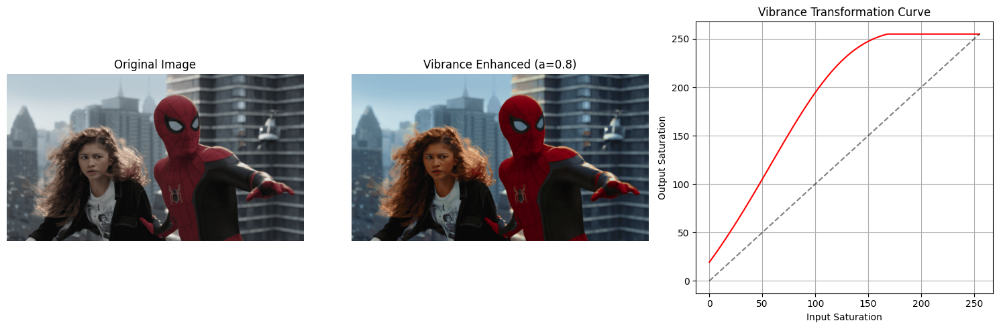

Used a = 0.8
Adjust 'a' value between 0-1 for different vibrance levels:
a = 0.3 (subtle), a = 0.6 (medium), a = 0.9 (strong)


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
image = cv2.imread('/content/spider.png')

if image is None:
    # Create a demo colorful image
    image = np.zeros((200, 200, 3), dtype=np.uint8)
    cv2.rectangle(image, (0, 0), (100, 200), (0, 0, 255), -1)    # Red
    cv2.rectangle(image, (100, 0), (200, 200), (0, 255, 0), -1)  # Green

# (a) Convert to HSV and split into planes
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv)

# (b) Apply vibrance transformation to saturation plane
a = 0.8  # Adjust this value (0-1) for different vibrance levels
sigma = 70

# Apply the formula: f(x) = min(x + a × 128 × exp(-(x-128)²/(2×70²)), 255)
enhancement = a * 128 * np.exp(-((s.astype(float) - 128) ** 2) / (2 * sigma ** 2))
s_enhanced = np.minimum(s.astype(float) + enhancement, 255).astype(np.uint8)

# (d) Recombine the three planes
hsv_enhanced = cv2.merge([h, s_enhanced, v])
result = cv2.cvtColor(hsv_enhanced, cv2.COLOR_HSV2BGR)

# Display results
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title(f'Vibrance Enhanced (a={a})')
plt.axis('off')

# (e) Plot the intensity transformation
plt.subplot(1, 3, 3)
x = np.arange(0, 256)
y = np.minimum(x + a * 128 * np.exp(-((x - 128) ** 2) / (2 * sigma ** 2)), 255)
plt.plot(x, y, 'r-')
plt.plot([0, 255], [0, 255], 'k--', alpha=0.5)
plt.title('Vibrance Transformation Curve')
plt.xlabel('Input Saturation')
plt.ylabel('Output Saturation')
plt.grid(True)

plt.tight_layout()
plt.show()

print(f"Used a = {a}")
print("Adjust 'a' value between 0-1 for different vibrance levels:")
print("a = 0.3 (subtle), a = 0.6 (medium), a = 0.9 (strong)")

Question 5


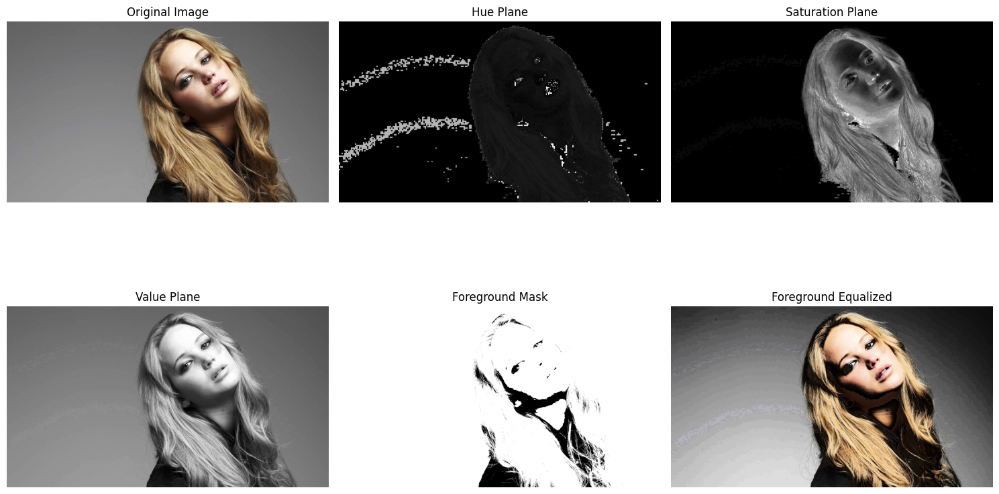

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
image = cv2.imread('/content/jeniffer.jpg')

# (a) Convert to HSV and split planes
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv)

# (b) Create foreground mask (simple threshold on value plane)
_, mask = cv2.threshold(v, 50, 255, cv2.THRESH_BINARY)

# (c) Extract foreground using mask
foreground = cv2.bitwise_and(v, v, mask=mask)

# (d) Calculate histogram and cumulative sum
hist = cv2.calcHist([foreground], [0], mask, [256], [0, 256])
cumsum = hist.cumsum()

# (e) Histogram equalization
cumsum_normalized = cumsum * 255 / cumsum.max()
v_equalized = cumsum_normalized[v].astype(np.uint8)

# Apply equalization only to foreground
v_result = v.copy()
v_result[mask > 0] = v_equalized[mask > 0]

# (f) Recombine with original hue and saturation
result_hsv = cv2.merge([h, s, v_result])
result = cv2.cvtColor(result_hsv, cv2.COLOR_HSV2BGR)

# Display results
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(h, cmap='gray')
plt.title('Hue Plane')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(s, cmap='gray')
plt.title('Saturation Plane')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(v, cmap='gray')
plt.title('Value Plane')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(mask, cmap='gray')
plt.title('Foreground Mask')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title('Foreground Equalized')
plt.axis('off')

plt.tight_layout()
plt.show()

Quetion 6

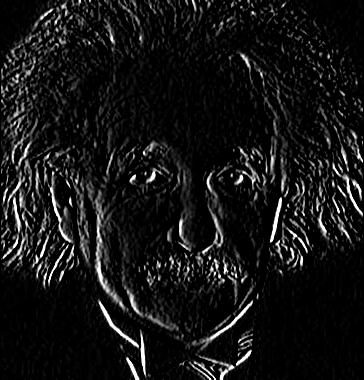

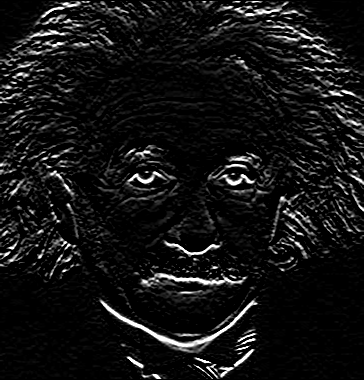

In [ ]:
#Using built-in-filter2D
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Import cv2_imshow

# Load image
image = cv2.imread('/content/einstein.png', cv2.IMREAD_GRAYSCALE)

# Sobel kernels
sobel_x_kernel = np.array([[-1, 0, 1],
                           [-2, 0, 2],
                           [-1, 0, 1]])

sobel_y_kernel = np.array([[-1, -2, -1],
                           [0, 0, 0],
                           [1, 2, 1]])

# Apply Sobel using filter2D
sobel_x = cv2.filter2D(image, -1, sobel_x_kernel)
sobel_y = cv2.filter2D(image, -1, sobel_y_kernel)

# Show results
cv2_imshow(sobel_x) # Use cv2_imshow
cv2_imshow(sobel_y) # Use cv2_imshow
# cv2.waitKey(0) # waitKey is not needed with cv2_imshow
# cv2.destroyAllWindows() # destroyAllWindows is not needed with cv2_imshow

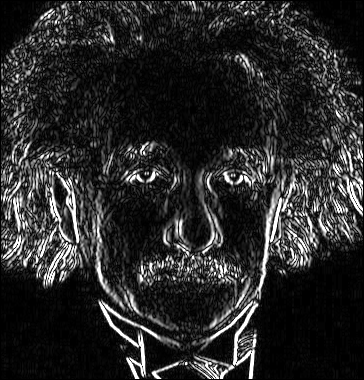

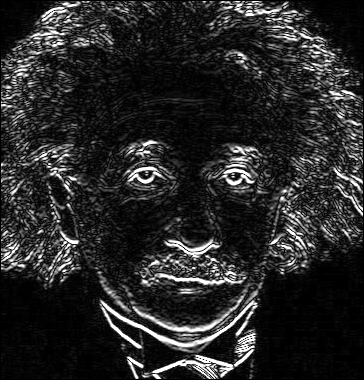

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Import cv2_imshow

# Load image
image = cv2.imread('/content/einstein.png', cv2.IMREAD_GRAYSCALE)

# Manual Sobel function
def manual_sobel(img):
    # Convert image to float32 to avoid overflow during calculations
    img = img.astype(np.float32)
    height, width = img.shape
    sobel_x = np.zeros_like(img)
    sobel_y = np.zeros_like(img)

    for y in range(1, height-1):
        for x in range(1, width-1):
            # X gradient
            gx = (img[y-1, x+1] + 2*img[y, x+1] + img[y+1, x+1]) - \
                 (img[y-1, x-1] + 2*img[y, x-1] + img[y+1, x-1])

            # Y gradient
            gy = (img[y+1, x-1] + 2*img[y+1, x] + img[y+1, x+1]) - \
                 (img[y-1, x-1] + 2*img[y-1, x] + img[y-1, x+1])

            sobel_x[y, x] = gx
            sobel_y[y, x] = gy

    # Convert back to uint8 after calculations (optional, depending on desired output)
    # You might want to keep it as float32 for further processing or visualization
    # If converting to uint8, you might need to handle negative values and clip to 0-255
    # For edge detection magnitude, you'd typically take the absolute value
    # For simplicity here, we'll return the float32 result to show the full range of gradients
    return sobel_x, sobel_y

sobel_x, sobel_y = manual_sobel(image)

# Show results
# Need to convert to a displayable format (e.g., scale and convert to uint8) for cv2_imshow
# A common way is to take the absolute value and normalize/scale
abs_sobel_x = cv2.convertScaleAbs(sobel_x)
abs_sobel_y = cv2.convertScaleAbs(sobel_y)


cv2_imshow(abs_sobel_x) # Use cv2_imshow
cv2_imshow(abs_sobel_y) # Use cv2_imshow
# cv2.waitKey(0) # waitKey is not needed with cv2_imshow
# cv2.destroyAllWindows() # destroyAllWindows is not needed with cv2_imshow

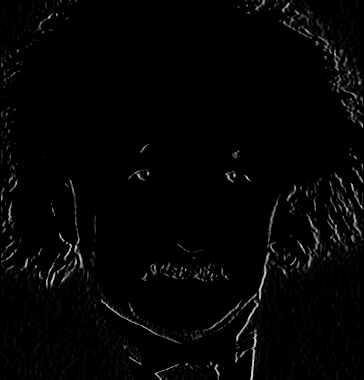

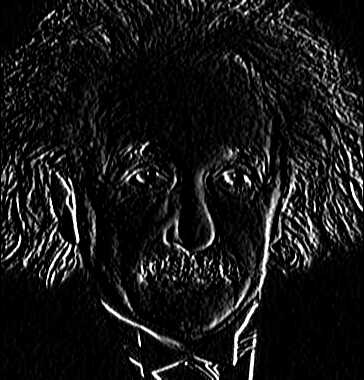

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Import cv2_imshow

# Load image
image = cv2.imread('/content/einstein.png', cv2.IMREAD_GRAYSCALE)

# Separable kernels
kernel_x = np.array([[1, 0, -1]])  # Horizontal gradient
kernel_y = np.array([[1], [2], [1]])  # Vertical smoothing

# Apply separable convolution
temp = cv2.filter2D(image, -1, kernel_y)
sobel_x_sep = cv2.filter2D(temp, -1, kernel_x)

temp = cv2.filter2D(image, -1, kernel_x)
sobel_y_sep = cv2.filter2D(temp, -1, kernel_y)

# Show results
# Need to convert to a displayable format (e.g., scale and convert to uint8) for cv2_imshow
# A common way is to take the absolute value and normalize/scale
abs_sobel_x_sep = cv2.convertScaleAbs(sobel_x_sep)
abs_sobel_y_sep = cv2.convertScaleAbs(sobel_y_sep)

cv2_imshow(abs_sobel_x_sep) # Use cv2_imshow
cv2_imshow(abs_sobel_y_sep) # Use cv2_imshow
# cv2.waitKey(0) # waitKey is not needed with cv2_imshow
# cv2.destroyAllWindows() # destroyAllWindows is not needed with cv2_imshow

Question 7


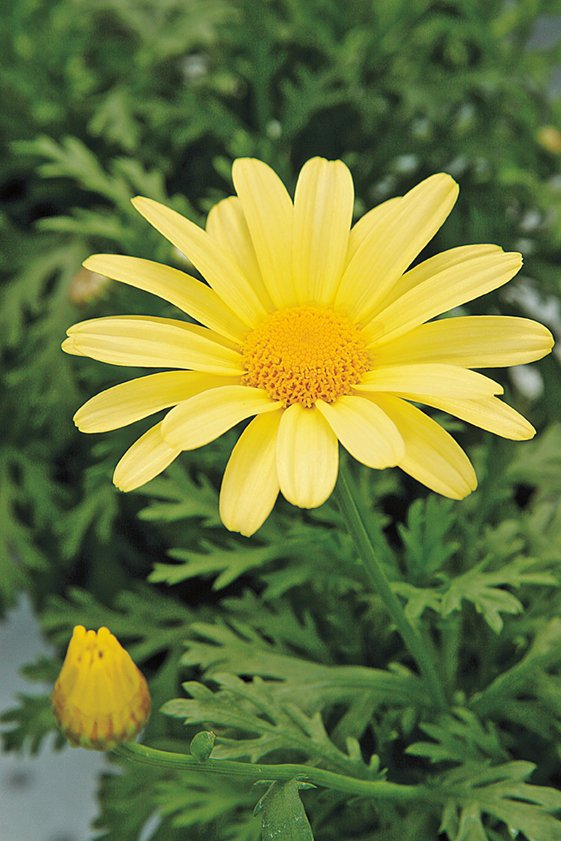

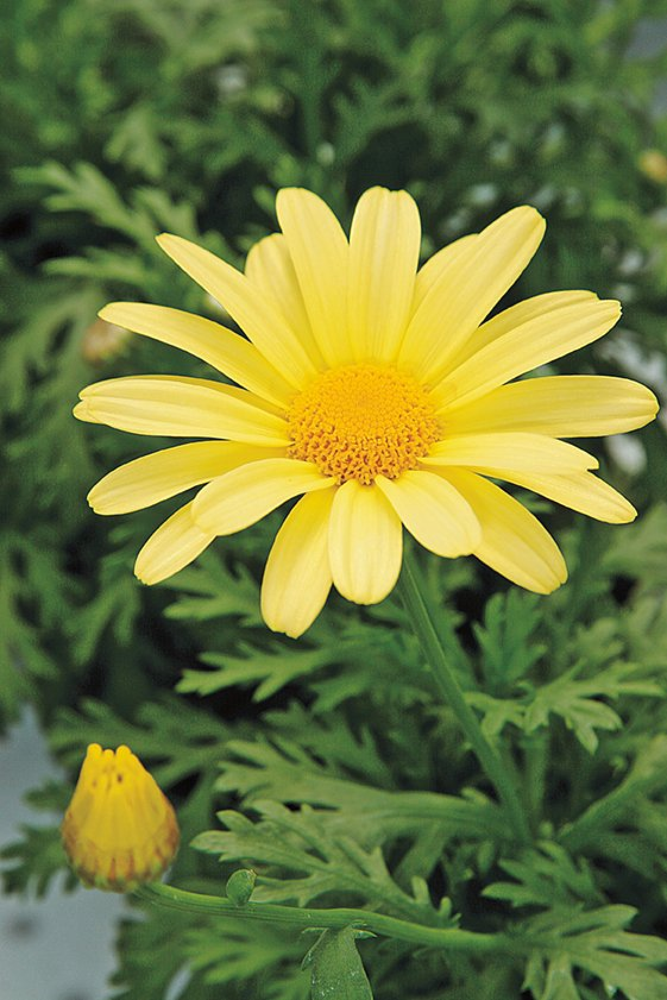

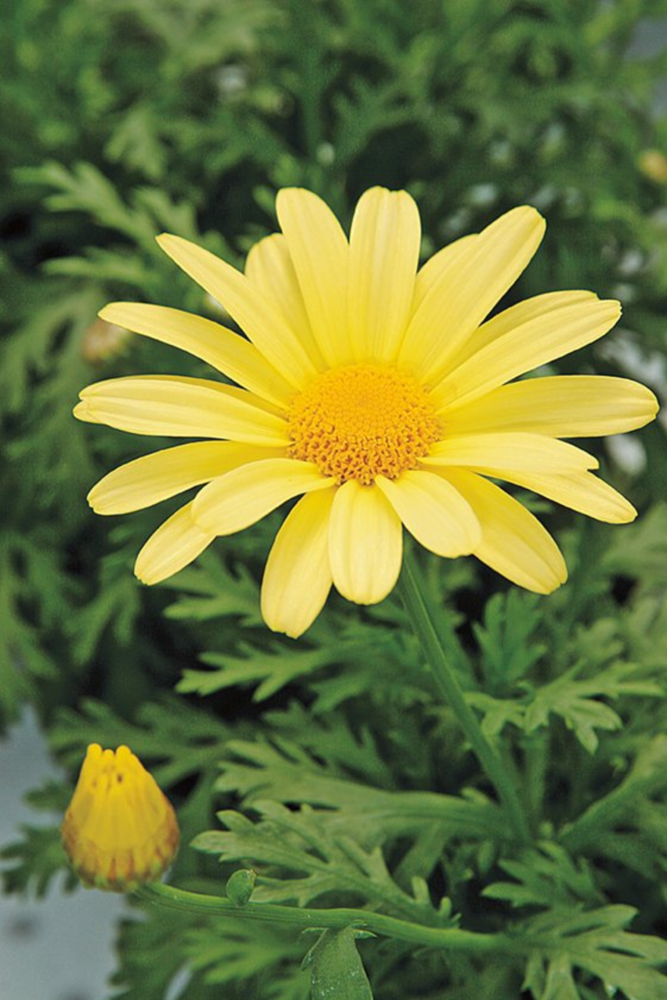

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Import cv2_imshow

# Load image
image = cv2.imread('/content/daisy.jpg')

if image is None:
    print("Image not found!")
else:
    # Zoom factor (2.0 = 2x bigger, 0.5 = 2x smaller)
    zoom_factor = 2.0

    # Method 1: Nearest Neighbor (fast, blocky)
    zoomed_nn = cv2.resize(image, None, fx=zoom_factor, fy=zoom_factor,
                          interpolation=cv2.INTER_NEAREST)

    # Method 2: Bilinear (slower, smoother)
    zoomed_bilinear = cv2.resize(image, None, fx=zoom_factor, fy=zoom_factor,
                               interpolation=cv2.INTER_LINEAR)

    # Show results
    cv2_imshow(image) # Use cv2_imshow
    cv2_imshow(zoomed_nn) # Use cv2_imshow - removed window name
    cv2_imshow(zoomed_bilinear) # Use cv2_imshow - removed window name
    # cv2.waitKey(0) # waitKey is not needed with cv2_imshow
    # cv2.destroyAllWindows() # destroyAllWindows is not needed with cv2_imshow

question 8

Original Image:


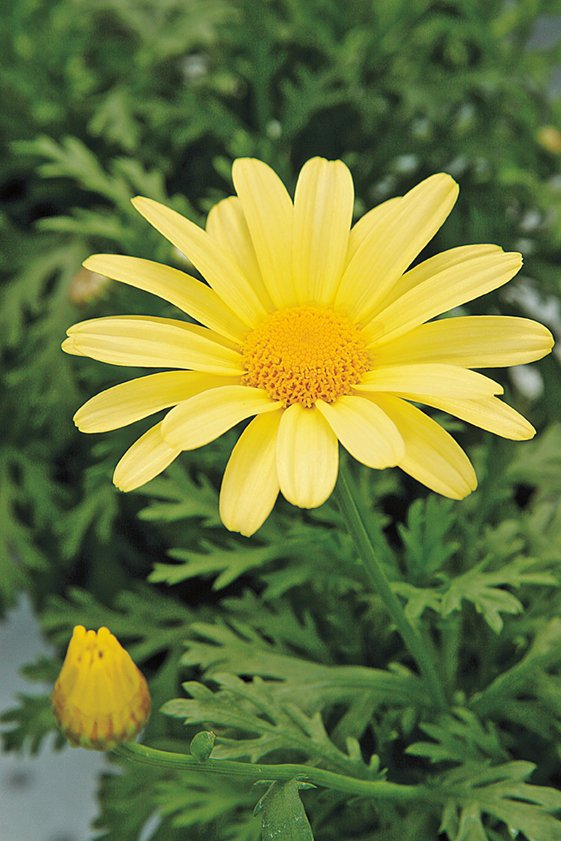


Segmentation Mask:


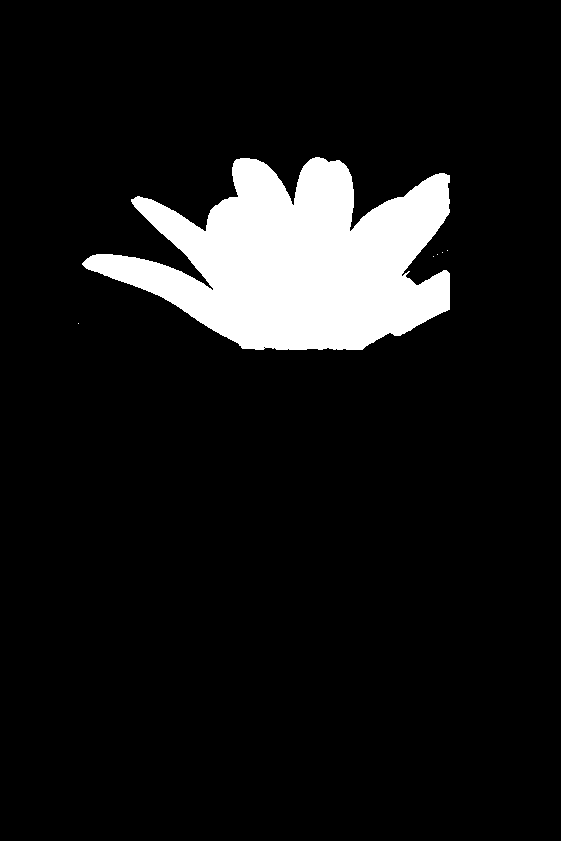


Foreground:


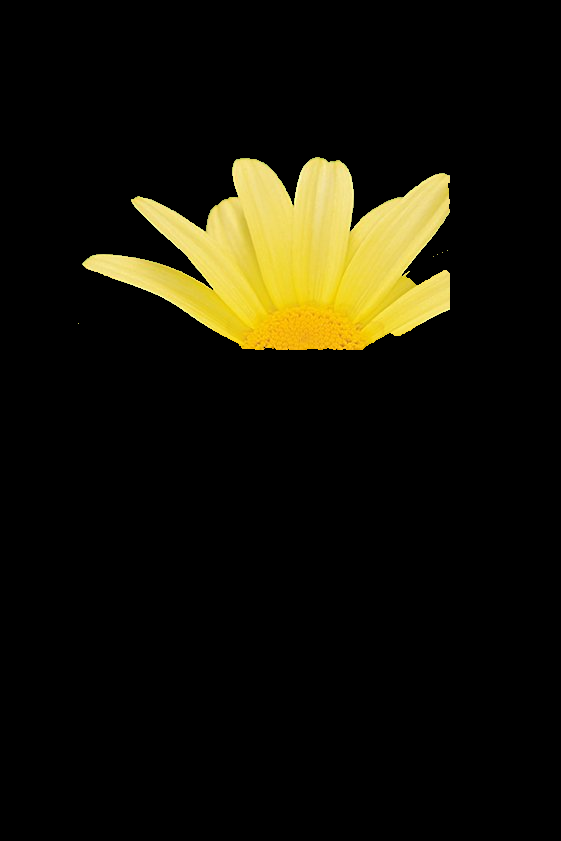


Background:


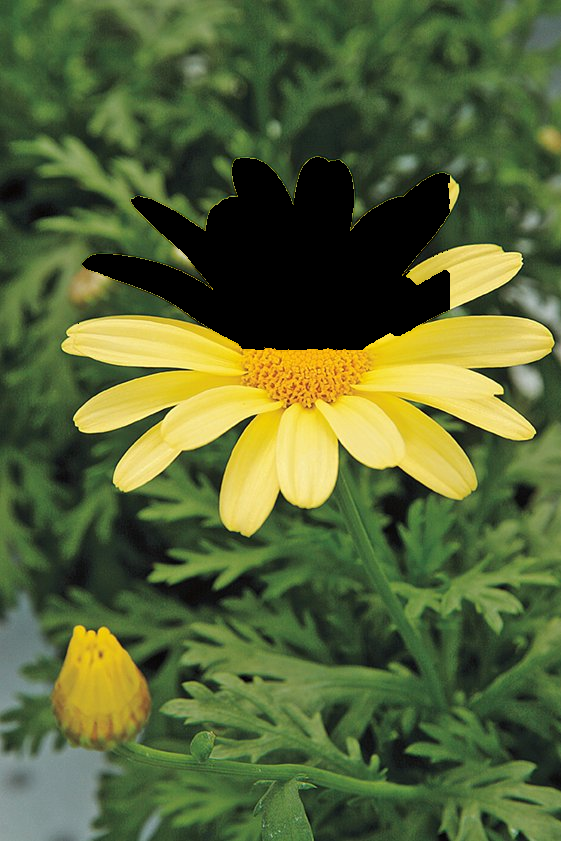

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load image
image = cv2.imread('/content/daisy.jpg')

# Create rectangle around object (adjust these numbers)
x, y, w, h = 50, 50, 400, 300
rect = (x, y, w, h)

# Setup for GrabCut
mask = np.zeros(image.shape[:2], np.uint8)
bgd_model = np.zeros((1, 65), np.float64)
fgd_model = np.zeros((1, 65), np.float64)

# Run GrabCut
cv2.grabCut(image, mask, rect, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_RECT)

# Create simple mask (0=background, 1=foreground)
final_mask = np.where((mask == 0) | (mask == 2), 0, 1).astype('uint8')

# Get foreground and background
foreground = cv2.bitwise_and(image, image, mask=final_mask)
background = cv2.bitwise_and(image, image, mask=1-final_mask)

# Show results in Colab
print("Original Image:")
cv2_imshow(image)

print("\nSegmentation Mask:")
cv2_imshow(final_mask * 255)  # Multiply by 255 to make visible

print("\nForeground:")
cv2_imshow(foreground)

print("\nBackground:")
cv2_imshow(background)

(b) Produceanenhancedimagewithasubstantiallyblurredbackground.Displaytheoriginal image
 alongsidetheenhancedimage.

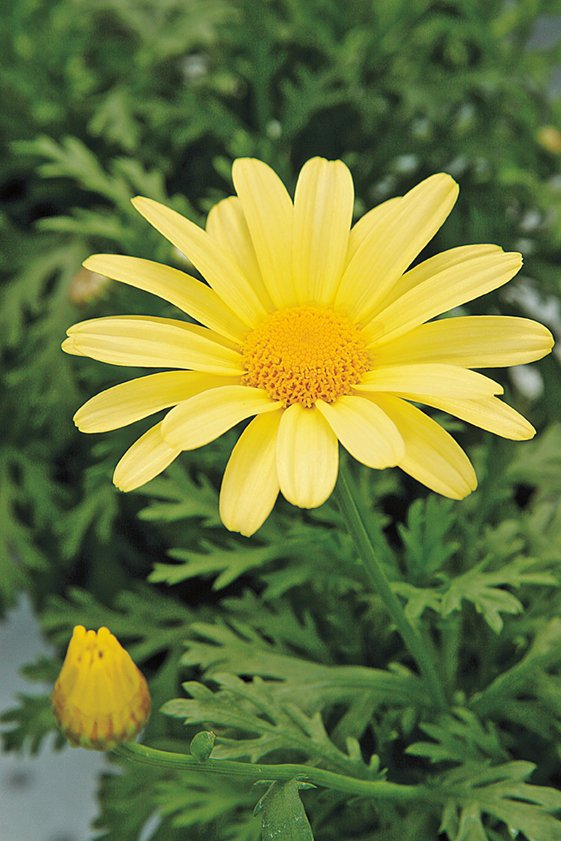

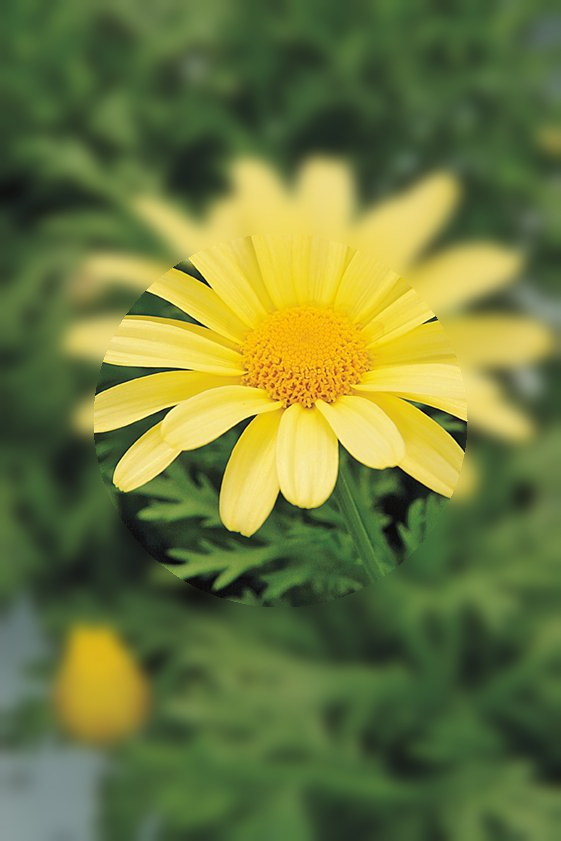

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/daisy.jpg')

# Create mask (center of image)
h, w = img.shape[:2]
mask = np.zeros((h, w), np.uint8)
cv2.circle(mask, (w//2, h//2), min(w, h)//3, 255, -1)

# Apply heavy blur and combine
blurred = cv2.GaussianBlur(img, (51, 51), 0)
result = cv2.bitwise_and(img, img, mask=mask) + cv2.bitwise_and(blurred, blurred, mask=255-mask)

cv2_imshow(img)
cv2_imshow(result)

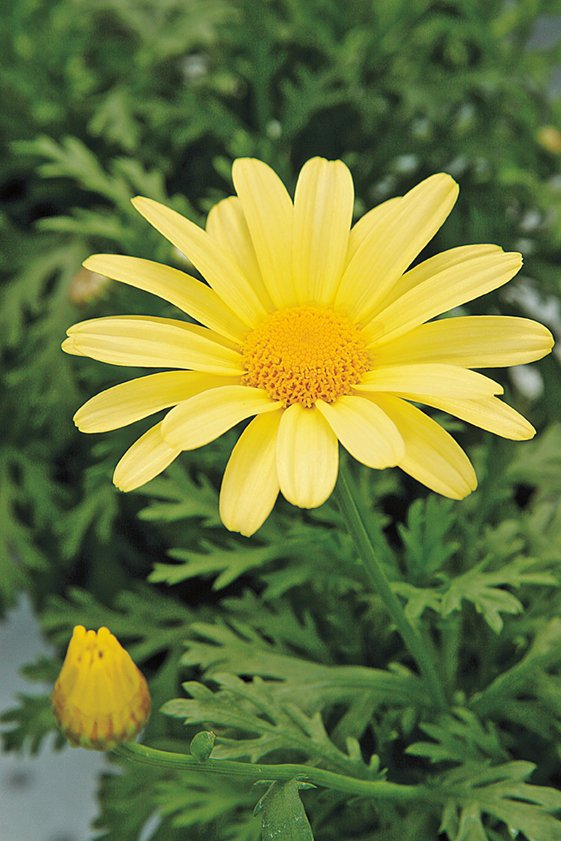

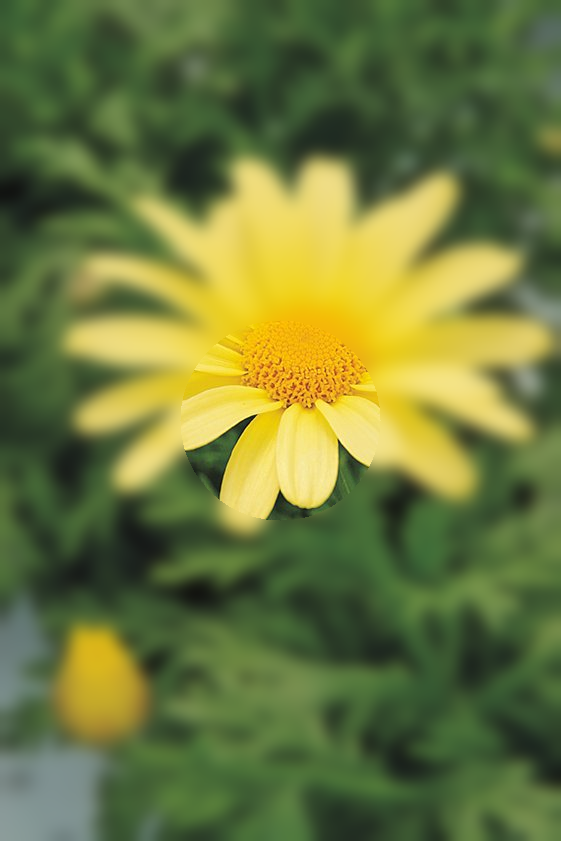

Dark edges appear because blurred background pixels mix with flower edges


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load image
img = cv2.imread('/content/daisy.jpg')

# Create a simple circle mask (like around a flower)
mask = np.zeros(img.shape[:2], np.uint8)
cv2.circle(mask, (img.shape[1]//2, img.shape[0]//2), 100, 255, -1)

# Blur the background heavily
blurred_bg = cv2.GaussianBlur(img, (51, 51), 0)

# Combine - this creates dark edges
result = np.where(mask[:, :, np.newaxis] == 255, img, blurred_bg)

# Show why it happens
cv2_imshow(img)
cv2_imshow(result)
print("Dark edges appear because blurred background pixels mix with flower edges")

Question 9

Original Image:


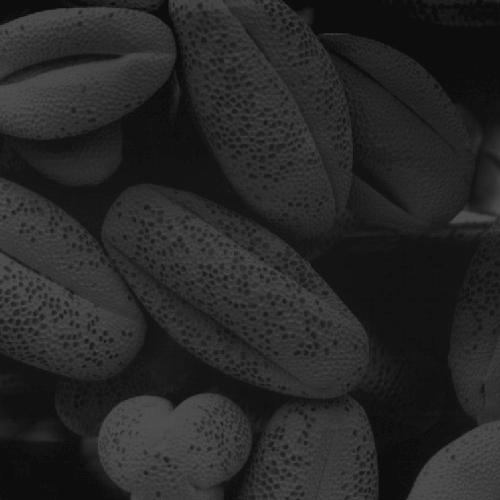


Denoised Image:


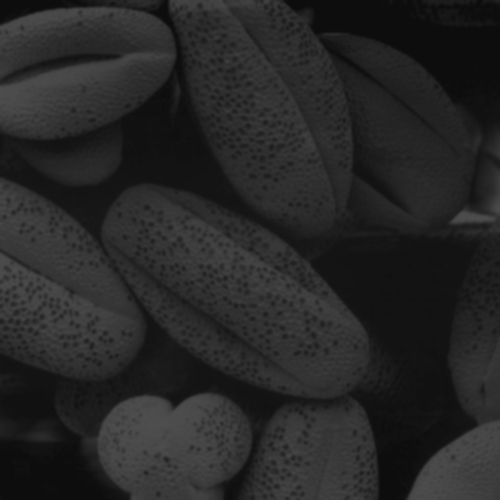


Otsu Thresholding:


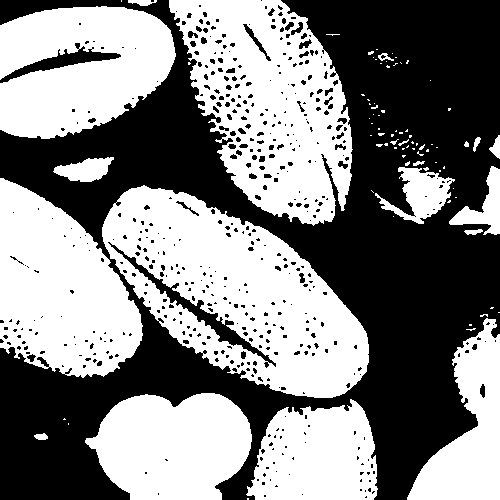


After Morphological Cleaning:


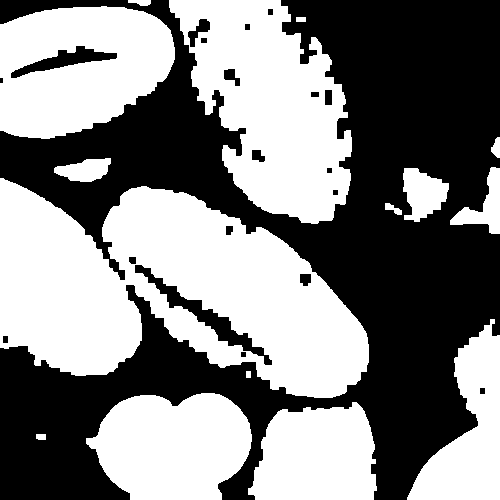


Number of rice grains: 15


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load image
image = cv2.imread('/content/shells.tif', cv2.IMREAD_GRAYSCALE)

# (a) Remove noise with Gaussian blur
denoised = cv2.GaussianBlur(image, (5, 5), 0)

# (c) Apply Otsu's thresholding
_, binary = cv2.threshold(denoised, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# (d) Morphological operations to clean up
kernel = np.ones((3,3), np.uint8)
cleaned = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)
cleaned = cv2.morphologyEx(cleaned, cv2.MORPH_CLOSE, kernel, iterations=2)

# (e) Count connected components
num_labels, labels = cv2.connectedComponents(cleaned)
rice_count = num_labels - 1  # Subtract 1 for background

# Display results
print("Original Image:")
cv2_imshow(image)

print("\nDenoised Image:")
cv2_imshow(denoised)

print("\nOtsu Thresholding:")
cv2_imshow(binary)

print("\nAfter Morphological Cleaning:")
cv2_imshow(cleaned)

print(f"\nNumber of rice grains: {rice_count}")

Question 10


Original Image:


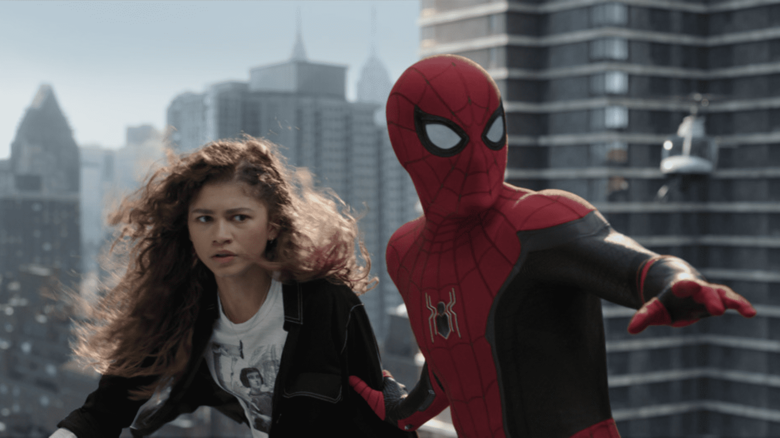


Binary Mask:


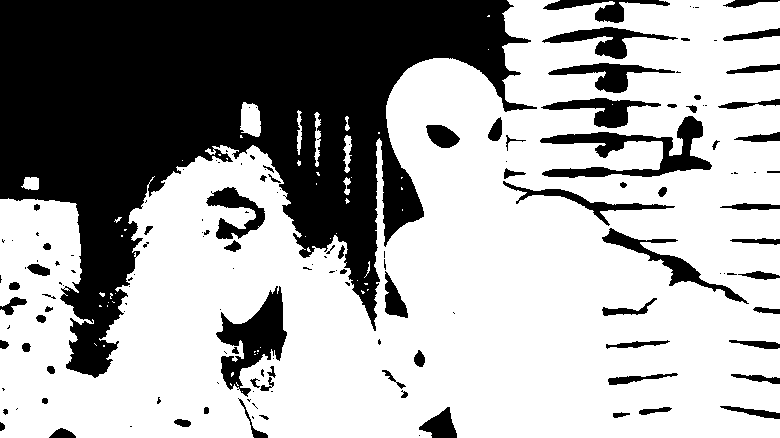


After Filling Holes:


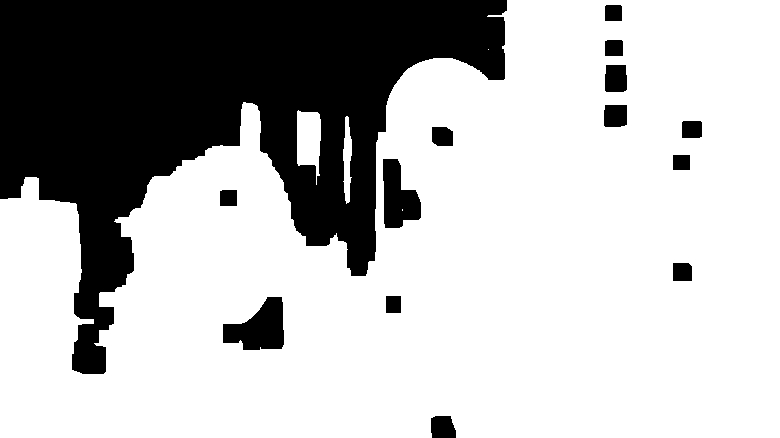


Number of sapphires found: 3
Sapphire 1: 244923 pixels → 881722800.00 mm²
Sapphire 2: 1280 pixels → 4608000.00 mm²
Sapphire 3: 537 pixels → 1933200.00 mm²


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import math

# Load image
image = cv2.imread('/content/spider.png')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# (a) Segment sapphires - adjust threshold value if needed
_, binary = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY_INV)

# (b) Fill holes with morphological closing
kernel = np.ones((15,15), np.uint8)
filled = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

# (c) Get areas using connectedComponentsWithStats
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(filled, connectivity=8)

# Filter out small objects and background
sapphire_areas = []
for i in range(1, num_labels):  # Skip background (label 0)
    if stats[i, cv2.CC_STAT_AREA] > 100:  # Minimum area threshold
        sapphire_areas.append(stats[i, cv2.CC_STAT_AREA])

# (d) Calculate actual areas (f=8mm, distance=480mm)
f = 8  # focal length in mm
d = 480  # distance in mm

actual_areas = []
for area_pixels in sapphire_areas:
    # Convert pixel area to actual area (simplified calculation)
    # This assumes square pixels and known camera calibration
    area_mm2 = area_pixels * (d/f)**2  # Simplified conversion
    actual_areas.append(area_mm2)

# Display results
print("Original Image:")
cv2_imshow(image)

print("\nBinary Mask:")
cv2_imshow(binary)

print("\nAfter Filling Holes:")
cv2_imshow(filled)

print(f"\nNumber of sapphires found: {len(sapphire_areas)}")
for i, (pixel_area, actual_area) in enumerate(zip(sapphire_areas, actual_areas)):
    print(f"Sapphire {i+1}: {pixel_area} pixels → {actual_area:.2f} mm²")